<a href="https://colab.research.google.com/github/math8485/Deep-learning/blob/main/Deep_learning_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install requests
!pip install -U sentence_transformers --q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 1.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.1/311.1 kB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 58.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 33.3 MB/s eta 0:00:00


In [2]:
import pandas as pd
from sentence_transformers import SentenceTransformer, util
from IPython.display import display, Image as IPImage
from IPython.display import display, HTML

In [3]:
# Specify the path to your TSV file
tsv_file_path = 'https://raw.githubusercontent.com/math8485/Deep-learning-assignment-2/main/tgif-v1.0.tsv'

# Read the TSV file into a DataFrame
df = pd.read_csv(tsv_file_path, sep='\t')

# Rename the columns
df.columns = ['gif', 'description']


In [4]:
# Choose an index from the DataFrame
index_to_display = 0

# Get the URL of the GIF
gif_url = df.iloc[index_to_display, 0]  # Assuming the URL is in the first column

# Display the GIF
display(HTML(f'<img src="{gif_url}" alt="GIF">'))


In [5]:
# Plotting the datafram
df

,gif,description
0,https://38.media.tumblr.com/9ead028ef62004ef6a...,a cat tries to catch a mouse on a tablet
1,https://38.media.tumblr.com/9f43dc410be85b1159...,a man dressed in red is dancing.
2,https://38.media.tumblr.com/9f659499c8754e40cf...,an animal comes close to another in the jungle
3,https://38.media.tumblr.com/9ed1c99afa7d714118...,a man in a hat adjusts his tie and makes a wei...
4,https://38.media.tumblr.com/9e437d26769cb2ac42...,someone puts a cat on wrapping paper then wrap...
...,...,...
125776,https://38.media.tumblr.com/5c0633e677a97a023c...,a woman with high heels and sexy red underwear...
125777,https://38.media.tumblr.com/402a02c59c7c47c300...,a girl with long dark hair is playing with her...
125778,https://38.media.tumblr.com/02fa66bd747ddbed58...,a guy is staring vapidly with one hand over ha...
125779,https://38.media.tumblr.com/01e70784925ab9fe09...,the man wearing a suit is eating a sliced apple.


In [30]:
# Load the respective CLIP model to be able to make a function that can read the gifs and relate them to text
model = SentenceTransformer('clip-ViT-B-32')

In [40]:


# Select the first 1000 rows becuase it takes a long time to load many gifs and
df = df.head(10000)

# Assuming you have a function to get image embeddings
def get_image_embeddings(image_paths):
    # Preprocess URLs into text
    image_texts = [f"Image at {path}" for path in image_paths]
    return model.encode(image_texts, batch_size=100, convert_to_tensor=True, show_progress_bar=True)

# Get image embeddings
img_names = df['gif'].tolist()
img_paths = img_names  # gif column already contains URLs
img_emb = get_image_embeddings(img_paths)

# Next, we define a search function.
def search(query, k=3):
    # First, we encode the query (which can either be an image or a text string)
    query_emb = model.encode([query], convert_to_tensor=True, show_progress_bar=False)

    # Then, we use the util.semantic_search function, which computes the cosine-similarity
    # between the query embedding and all image embeddings.
    # It then returns the top_k highest-ranked images, which we output
    hits = util.semantic_search(query_emb, img_emb, top_k=k)[0]

    print("Query:")
    print(query)

    for hit in hits:
        print("Description:")
        print(df['description'][hit['corpus_id']])

        # Display the GIF
        display(IPImage(df['gif'][hit['corpus_id']], width=100))




Batches:   0%|          | 0/10 [00:00<?, ?it/s]

Query:
a man
Description:
two men wearing scary masks talk into microphones.


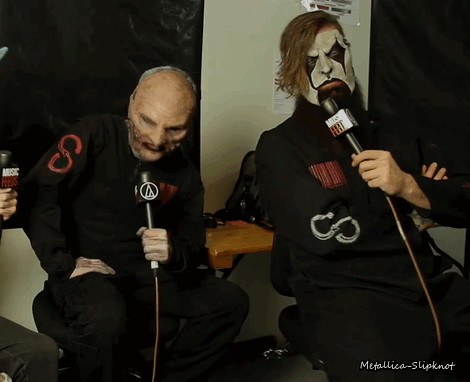

Description:
a man in a hat is drinking his coffee


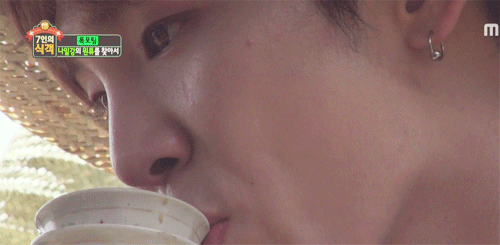

Description:
singing band is posing and being silly for pictures.


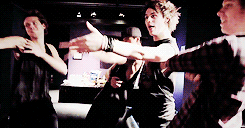

In [41]:
# Now you can use the search function since we dont have the biggest sample sice the gifs are not totally accurate but we get somthing
# close to what we are searchin for
search("a man")

Query:
party
Description:
singing band is posing and being silly for pictures.


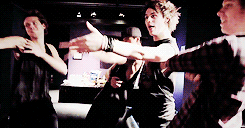

Description:
man bopping his head as he stands up off the bed.


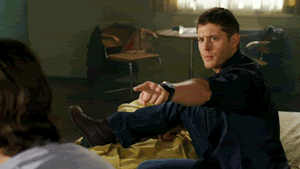

Description:
an American actress is turning around in fear.


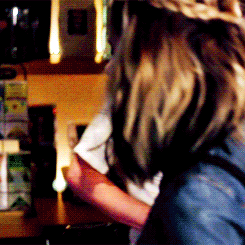

In [42]:
search("party")